# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

In [13]:
df = pd.read_csv('covid19_ready_data.csv', low_memory=False, parse_dates=['date'])
df.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cvd_death_rate,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,month,year,week,weekday,quarter,day_of_week,week_or_end
0,AFG,Asia,Afghanistan,2019-12-31,0,0,0,0,0.00,0.00,0.00,0.00,0.00,38928341.00,54.42,18.60,2.58,1.34,1803.99,1.50,597.03,9.59,7.00,31.40,0.50,12,2019,1,1,4,Tuesday,week_day
1,AFG,Asia,Afghanistan,2020-01-01,0,0,0,0,0.00,0.00,0.00,0.00,0.00,38928341.00,54.42,18.60,2.58,1.34,1803.99,1.50,597.03,9.59,7.00,31.40,0.50,1,2020,1,2,1,Wednesday,week_day
2,AFG,Asia,Afghanistan,2020-01-02,0,0,0,0,0.00,0.00,0.00,0.00,0.00,38928341.00,54.42,18.60,2.58,1.34,1803.99,1.50,597.03,9.59,7.00,31.40,0.50,1,2020,1,3,1,Thursday,week_day
3,AFG,Asia,Afghanistan,2020-01-03,0,0,0,0,0.00,0.00,0.00,0.00,0.00,38928341.00,54.42,18.60,2.58,1.34,1803.99,1.50,597.03,9.59,7.00,31.40,0.50,1,2020,1,4,1,Friday,week_day
4,AFG,Asia,Afghanistan,2020-01-04,0,0,0,0,0.00,0.00,0.00,0.00,0.00,38928341.00,54.42,18.60,2.58,1.34,1803.99,1.50,597.03,9.59,7.00,31.40,0.50,1,2020,1,5,1,Saturday,weekend


In [14]:
month_continents = df[df['month'] != 12].pivot_table(
    index=['month'],
    values='total_cases',
    columns='continent',
    aggfunc='median'
)

month_continents

continent,Africa,Asia,Europe,North America,Oceania,South America
month,,,,,,
1,0.00,0.00,0.00,0.00,0.00,0.00
2,0.00,1.00,0.00,3.00,5.00,0.00
3,7.00,98.00,197.00,16.00,46.50,54.00
4,65.50,1024.00,2972.00,73.00,332.50,1033.50
5,367.00,3392.00,7731.00,116.00,575.00,5588.50
6,882.00,8337.00,8548.00,164.00,586.00,16501.50


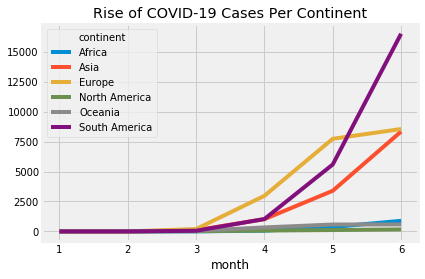

In [15]:
month_continents.plot(title="Rise of COVID-19 Cases Per Continent")

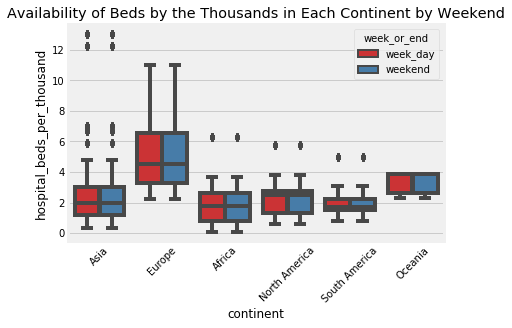

In [16]:
sns.boxplot(x="continent", y="hospital_beds_per_thousand", 
            hue="week_or_end", data=df, palette="Set1")

plt.title("Availability of Beds by the Thousands in Each Continent by Weekend")
plt.xticks(rotation=45)
plt.show()

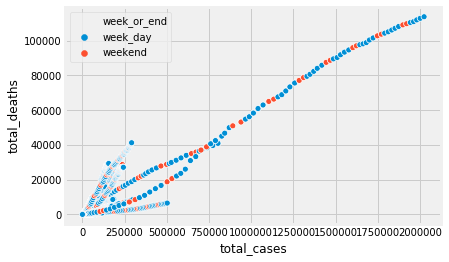

In [17]:
sns.scatterplot(x='total_cases', y='total_deaths', hue='week_or_end', data=df)

The following is an addapted example from Damien Farrell. You can find the source [code here](https://dmnfarrell.github.io/plotting/bokeh-covid19).

In [18]:
import random
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, ColorBar, HoverTool, Legend
from bokeh.plotting import figure
from bokeh.palettes import brewer
from bokeh.layouts import row, column, gridplot
from bokeh.models import CustomJS, Slider, Select, Plot, Button, LinearAxis, Range1d, DatetimeTickFormatter
from bokeh.models.glyphs import Line, MultiLine

In [19]:
from datetime import datetime
df['new_date'] = df['date'].apply(lambda x: x.strftime("%d-%b"))
df['new_date'].head()

0    31-Dec
1    01-Jan
2    02-Jan
3    03-Jan
4    04-Jan
Name: new_date, dtype: object

In [20]:
df = df.sort_values(['location', 'date'])

df['cumcases'] = df.groupby(['location'])['total_cases'].apply(lambda x: x.cumsum())

In [21]:
data = pd.pivot_table(df, index='date', 
                      columns='location', 
                       values='cumcases').reset_index()

data.head()

location,date,Afghanistan,Albania,Algeria,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Cape Verde,Cayman Islands,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo,Costa Rica,Cote d'Ivoire,Croatia,Cyprus,Czech Republic,Democratic Republic of Congo,Denmark,Djibouti,Dominica,Dominican Republic,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Ethiopia,Fiji,Finland,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,Norway,Oman,Pakistan,Palestine,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,San Marino,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Sint Maarten (Dutch part),Slovakia,Slovenia,South Africa,South Korea,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Tajikistan,Tanzania,Thailand,Timor,Togo,Trinidad and Tobago,Tunisia,Turkey,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
0,2019-12-31,0.00,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,nan,0.00,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,0.00,nan,0.00,nan,nan,nan,nan,nan,27.00,nan,nan,nan,nan,nan,0.00,nan,0.00,nan,0.00,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,nan,nan,0.00,0.00,nan,nan,0.00,0.00,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,nan,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,0.00,0.00,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,0.00,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,nan,nan,nan
1,2020-01-01,0.00,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,nan,0.00,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,0.00,nan,0.00,nan,nan,nan,nan,nan,54.00,nan,nan,nan,nan,nan,0.00,nan,0.00,nan,0.00,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,nan,nan,0.00,0.00,nan,nan,0.00,0.00,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,nan,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,0.00,0.00,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,0.00,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,nan,nan,nan
2,2020-01-02,0.00,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,nan,0.00,nan,nan,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,0.00,nan,0.00,nan,nan,nan,nan,nan,81.00,nan,nan,nan,nan,nan,0.00,nan,0.00,nan,0.00,nan,nan,0.00,0.00,0.00,nan,nan,nan,0.00,nan,nan,0.00,0.00,nan,nan,0.00,0.00,nan,0.00,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,nan,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,0.00,0.00,0.00,0.00,nan,nan,nan,nan,nan,0.00,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,0.00,nan,nan,nan,nan,nan,

In [22]:
summary = (df.groupby('location')
           .agg({'total_deaths':np.sum,
                 'total_cases':np.sum})
           .reset_index())

In [23]:
source = ColumnDataSource(data)

In [24]:
filt_data1 = data[['date','Australia']].rename(columns={'Australia':'total_cases'})

In [25]:
filt_data2 = data[['date', 'Dominican Republic']].rename(columns={'Dominican Republic':'total_cases'})

In [27]:
src2 = ColumnDataSource(filt_data1)
src3 = ColumnDataSource(filt_data2)

hover_tool = HoverTool(tooltips=[
            ('Cases', '@total_cases'),
            ('Date', '@date')],
            formatters={'date': 'datetime'}
        )

p1 = figure(plot_width=700, plot_height=500, x_axis_type='datetime',
            tools=[hover_tool], title='Total COVID Cases Over Time per Country',
            y_range=Range1d(start=0, end=filt_data1['total_cases'].max() + 70))

p1.line(x='date', y='total_cases', source=src2, legend_label="Country 1", 
        line_color='blue', line_width=3, line_alpha=.7)

p1.extra_y_ranges = {"y2": Range1d(start=0, end=filt_data2['total_cases'].max() + 70)}

p1.add_layout(LinearAxis(y_range_name="y2"), 'right')

p1.line(x='date',y='total_cases', source=src3, legend_label="Country 2", line_color='green',
        line_width=3, line_alpha=.7, y_range_name="y2")

p1.yaxis[0].axis_label = 'Australia'
p1.yaxis[1].axis_label = 'Dominican Republic'
p1.background_fill_color = "whitesmoke"
p1.background_fill_alpha = 0.5
p1.legend.location = "top_left"
p1.xaxis.axis_label = 'Date'
p1.xaxis.formatter=DatetimeTickFormatter(days="%d/%m", months="%m/%d")

#JavaScript Snippet
code="""
var c = cb_obj.value;
ax.axis_label = c;
var y = s1.data[c];
s2.data['cases'] = y;
y_range.start = 0;
y_range.end = parseInt(y[y.length - 1]+50);
s2.change.emit();
"""

callback1 = CustomJS(args=dict(s1=source, s2=src2, y_range=p1.y_range, ax=p1.yaxis[0]), code=code)

callback2 = CustomJS(args=dict(s1=source,s2=src3,y_range=p1.extra_y_ranges['y2'],ax=p1.yaxis[1]), code=code)

names = list(df['location'].unique())

names_sub=['Australia', 'United_Kingdom', 'United States', 'Spain', 'Italy', 'Germany',
           'France','Iran','Dominican Republic','Ireland','Sweden','Belgium','Turkey', 'India']

select1 = Select(title="Country 1:", value='Australia', options=names_sub)

select1.js_on_change('value', callback1)

select2 = Select(title="Country 2:", value='Dominican Republic', options=names)

select2.js_on_change('value', callback2)

btn = Button(label='Update')

layout = column(row(select1,select2), row(p1))

show(layout)

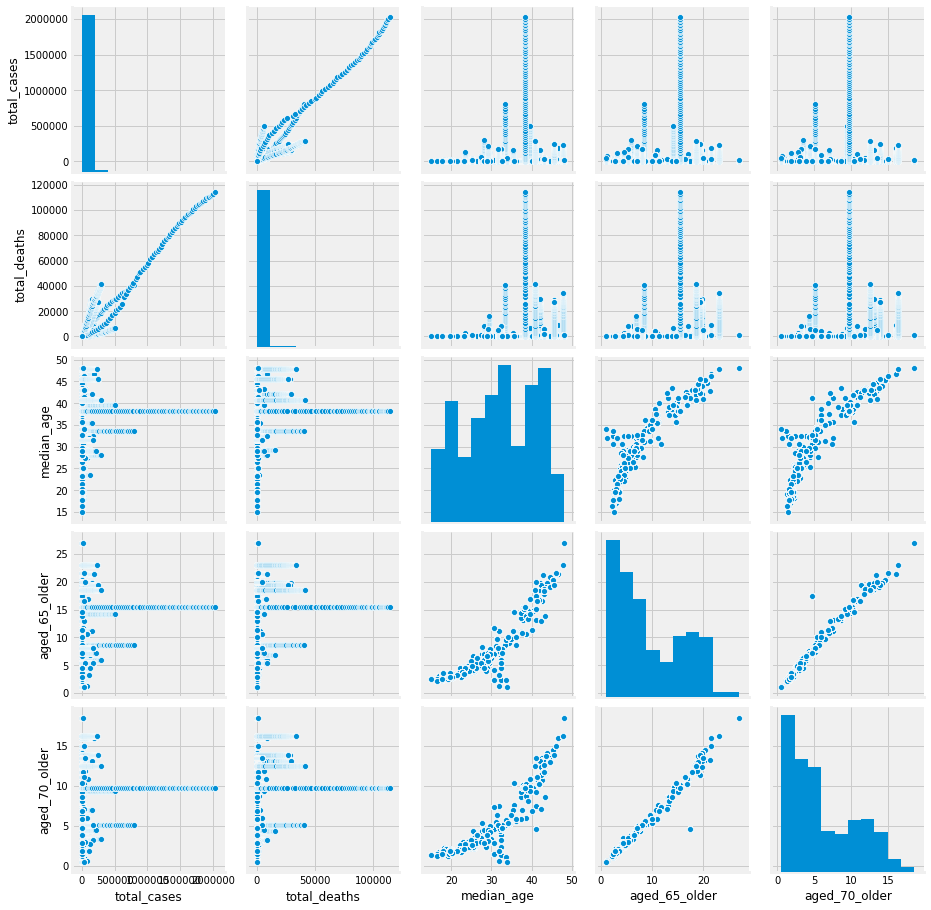

In [28]:
sns.pairplot(df[['total_cases', 'total_deaths', 'median_age', 'aged_65_older', 'aged_70_older']], kind="scatter")
plt.show()

In [29]:
import altair as alt

In [33]:
alt.Chart(df.sample(5000)).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='Origin:N'
).properties(
    width=200,
    height=200
).repeat(
    row=['total_cases', 'median_age', 'total_deaths'],
    column=['total_cases', 'median_age', 'total_deaths']
).interactive()

alt.RepeatChart(...)

In [38]:
alt.Chart(df.sample(5000)).mark_circle(
    opacity=0.8,
    stroke='black',
    strokeWidth=1
).encode(
    alt.X('new_date:O', axis=alt.Axis(labelAngle=0)),
    alt.Y('day_of_week:N'),
    alt.Size('total_cases:Q',
        scale=alt.Scale(range=[0, 5000]),
        legend=alt.Legend(title='Total COVID Cases')
    ),
    alt.Color('month:N', legend=None)
).properties(
    width=550,
    height=420
).transform_filter(
    alt.datum.Entity != 'NA'
)

alt.Chart(...)

In [40]:
alt.Chart(df.sample(5000)).transform_fold(
    ['median_age', 'aged_65_older', 'aged_70_older'],
    as_=['Ages', 'Cases']
).mark_area(
    opacity=0.3,
    interpolate='step'
).encode(
    alt.X('Cases:Q', bin=alt.Bin(maxbins=30)),
    alt.Y('count()', stack=None),
    alt.Color('Ages:N')
)

alt.Chart(...)